# 🐶 dog End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dof, I want to know what breed of dog it is.

## 2. Data

Data we are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

THe evaluation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set.(These images have labels)
* There are around 10,000+ images in the test set.( These images don't have labels)

In [78]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [79]:
#!unzip "drive/MyDrive/Dog_Vision-20250114T040659Z-001.zip" -d "drive/MyDrive/"

### Get our workplace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using GPU

In [80]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)
# Check for GPU availability
if tf.config.list_physical_devices('GPU'):
  print("GPU available")
else:
  print("GPU Not available")

2.17.1
0.16.1
GPU available


## Getting our data ready (turning into Tensors)

With all machine learning mdoels, our data has to be in numerical format. SO that's what we'll be doing first. Turning our images into Tensors(numerical representations)

Let's start by accessing our data and checking out the labels.

In [81]:
# Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog_Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: ylabel='breed'>

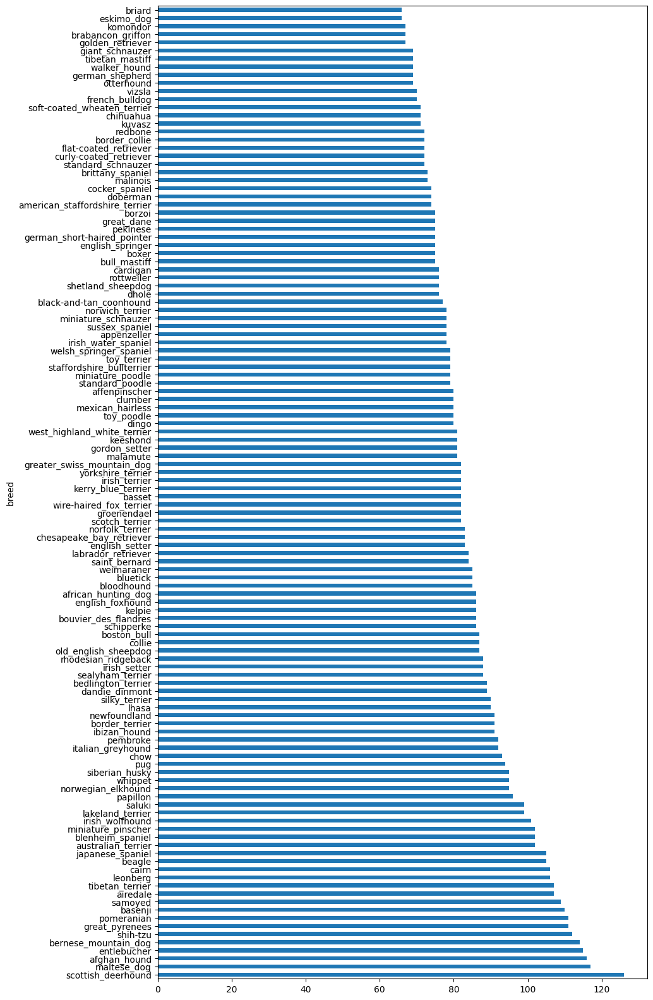

In [82]:
# How many images are there in each breed
labels_csv["breed"].value_counts().plot.barh(figsize=(10,20))

In [83]:
labels_csv["breed"].value_counts().median()

82.0

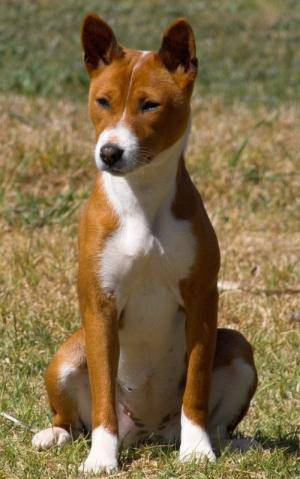

In [84]:
# Let's view an image
from IPython.display import Image
# Corrected the file path to match the path you used in cell 2
Image(filename="drive/MyDrive/Dog_Vision/train/ffa4e1bf959425bad9228b04af40ac76.jpg")

### Getting images and their labels

Let's get a list of all our file pathnames.

In [85]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [86]:
# Create pathnames from image IDs
filenames=[]
for fname in labels_csv["id"]:
  filenames.append("drive/MyDrive/Dog_Vision/train/"+fname+".jpg")

filenames[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [87]:
len(filenames)

10222

In [88]:
# Check whether number of filenames matches number of actual image files

In [89]:
import os
if(len(os.listdir("drive/MyDrive/Dog_Vision/train"))==len(filenames)):
  print("Equal number of files")
else:
  print("Not equal number")

Equal number of files


In [90]:
# One more check
Image(filenames[9000])
labels_csv['breed'][9000]

'tibetan_mastiff'

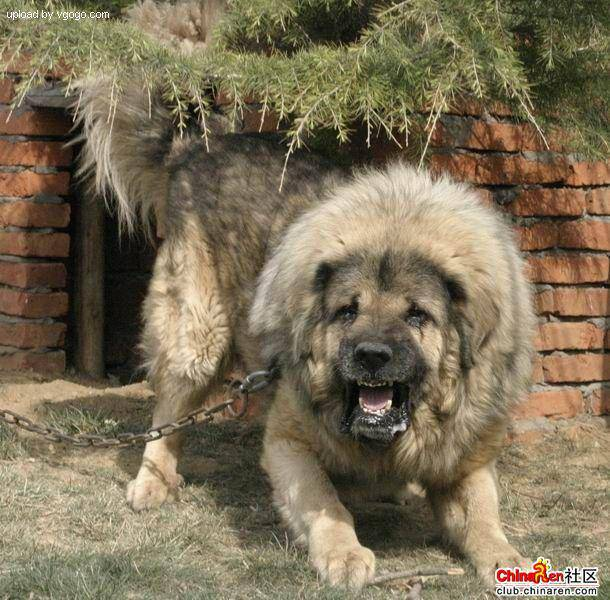

In [91]:
Image(filename="drive/MyDrive/Dog_Vision/train/"+labels_csv["id"][9000]+".jpg")

Since we've got our training image filepaths in list, let's prepare our labels.

In [92]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [93]:
# Check if number of labels match the number of filenames
if len(labels)==len(filenames):
  print("Yup")

Yup


In [94]:
# Find the unique label values
unique_breeds=np.unique(labels)
print(unique_breeds)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

In [95]:
len(unique_breeds)

120

In [96]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [97]:
# Turn every label into a boolean array
boolean_labels=[]
for label in labels:
  boolean_labels.append(label== unique_breeds)

boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [98]:
len(boolean_labels)

10222

In [99]:
# Example: Turning boolean array into integers
print(labels[0])# original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our validation set

Since dataset from kaggle doesn't come with a validation set, we're going to create our own

In [100]:
# Setup our X and Y variables
X=filenames
Y=boolean_labels

len(X)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [101]:
# Set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [102]:
# Lets split our data into training and validation sets
from sklearn.model_selection import train_test_split

X_train,X_valid,Y_train,Y_valid=train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],random_state=42,test_size=0.2)

len(X_train),len(Y_train),len(X_valid),len(Y_valid)

(800, 800, 200, 200)

In [103]:
# Lets have a heez at the training data
X_train[:5],Y_train[:2]

(['drive/MyDrive/Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog_Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog_Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog_Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepth as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to the shape of (224,224)
5. Return the modified image

Before we do that lets see what importing an image looks like.


In [104]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

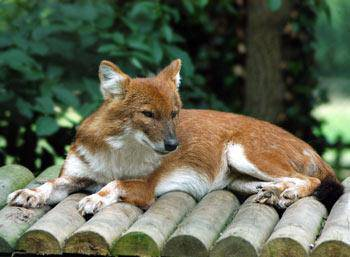

In [105]:
Image(filename=filenames[42])

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
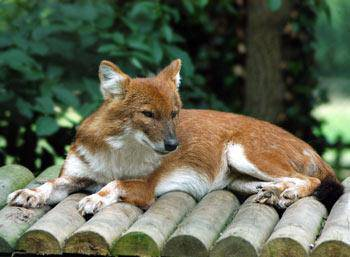

In [106]:
image

In [107]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepth as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel valuesfrom 0-255 to 0-1).
5. Resize the `image` to the shape of (224,224)
6. Return the modified image

In [108]:
# define image size
IMG_SIZE=224

# Create a function for preprocessing images
def process_image(image_path,label=None):
  """
  Takes an image file path and turns the image into a tensor
  """
  # Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  # Covert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  if label is None:
    return image
  else:
    return image, label

In [109]:
image=tf.io.read_file(filenames[42])
image

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [110]:
image.dtype

tf.string

In [111]:
image=tf.image.decode_jpeg(image,channels=3)
image

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [112]:
image=tf.image.convert_image_dtype(image,tf.float16)
image.shape

TensorShape([257, 350, 3])

In [113]:
image=tf.image.resize(image,size=[224,224])
image.shape
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.326508  , 0.5221965 , 0.3232344 ],
        [0.2537375 , 0.44367617, 0.24115196],
        [0.2569776 , 0.4467719 , 0.23892087],
        ...,
        [0.29330826, 0.5189174 , 0.32151932],
        [0.29727745, 0.5245724 , 0.33023372],
        [0.29491943, 0.52221435, 0.33398193]],

       [[0.25896916, 0.4538538 , 0.27299517],
        [0.243777  , 0.44068936, 0.2554564 ],
        [0.28386524, 0.4721297 , 0.2829905 ],
        ...,
        [0.27842304, 0.50278825, 0.3100567 ],
        [0.28434372, 0.5108294 , 0.32518658],
        [0.28826004, 0.5147457 , 0.32910293]],

       [[0.20941609, 0.40698427, 0.25789452],
        [0.24047197, 0.43900353, 0.28682286],
        [0.28995404, 0.479402  , 0.3224384 ],
        ...,
        [0.2606986 , 0.4842096 , 0.3012957 ],
        [0.27093315, 0.49456596, 0.32092968],
        [0.27928463, 0.5029174 , 0.32928112]],

       ...,

       [[0.00634785, 0.03442416, 0.0258102 ],
        [0.01

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time(you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`

In [114]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image=process_image(image_path)
  return image, label

In [115]:
# Demo of the above
(process_image(filenames[42])),tf.constant(Y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)`, let's make a function to turn all of our data into batches!

In [116]:
# Define batch size 32
BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(X,Y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (Y) pairs.
  the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(X))# Only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Create validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches:")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the mage path into a preprocessed image)
    data=data.map(process_image)

    # Turn training data into batches
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [117]:
# Create training and validation data batches
train_data=create_data_batches(X_train,Y_train)
val_data=create_data_batches(X_valid,Y_valid,valid_data=True)

Creating training data batches:
Create validation data batches...


In [118]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them

In [119]:
import matplotlib.pyplot as plt

In [120]:

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  ## Setup figure
  plt.figure(figsize=(10,10))
  # Loop through 25 images
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [121]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [122]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

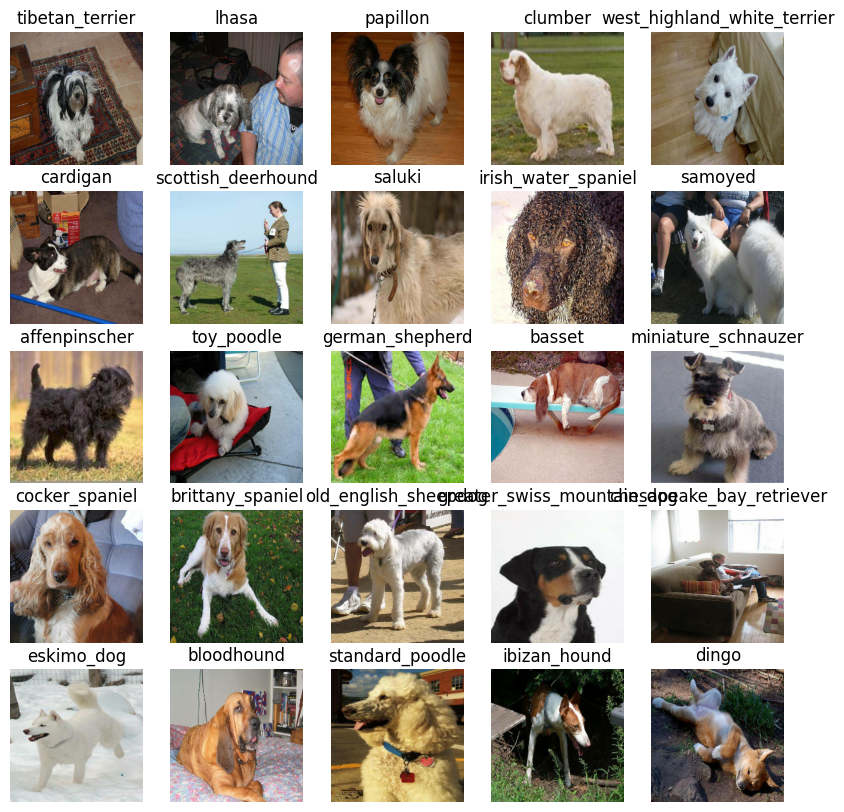

In [123]:
# Now lets visualize data in a training batch
show_25_images(train_images,train_labels)

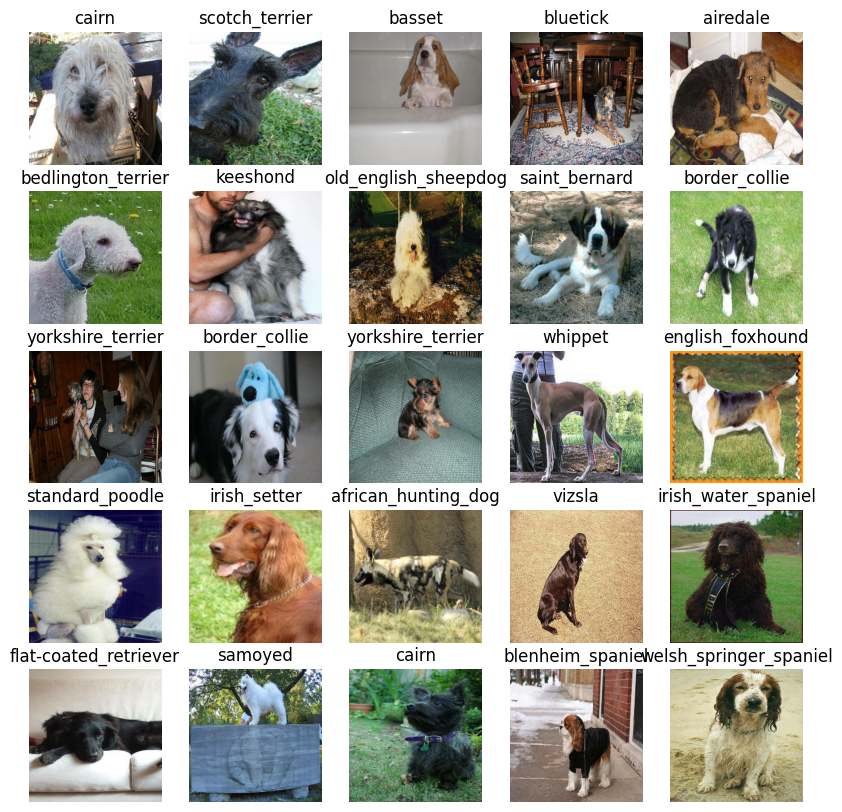

In [124]:
# Now lets visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a mode, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [125]:
# Setup the input shape to the model
INPUT_SHAPE=[None,224,224,3] # batch,height,width,colour channels

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

INPUT_SHAPE[1:]

[224, 224, 3]

Now we've got our inputs , outpus and model ready to go, Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this, then that).
* Compiles the model(says it should be evaluated and imrpoved).
* Builds the model(tells the model the input shape it'll be getting).
* Return the model.

All these steps can be found here:- https://www.tensorflow.org/guide/keras

In [126]:
import tensorflow_hub as hub
import tf_keras

In [127]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Creates a mobilenetv2 model
  """
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [128]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creaating callbacks

Callbacks are helper functions a model can use during training to such things as save its progress, check its progress or stop training if a model stops imporving.

We'll create two callbacks, one for TensorBoard which helps track our model's progress and another early stopping which prevents our model from training for too long.

### TensorBoard Callback
To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model's training).

In [129]:
import datetime

In [130]:
# Load TensorBoard notebook extension

%load_ext tensorboard

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog_Vision/logs",datetime.datetime.now().strftime("%Y%m%%d-%H%M%S"))

  return tf_keras.callbacks.TensorBoard(logdir)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [131]:
# Create early stopping callback
early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [132]:
NUM_EPOCHS=100#@param {type:"slider",min:10,max:100,step:10}

In [133]:
# Check we are still using a GPU
print("GPU","available (YESS!)"if tf.config.list_physical_devices("GPU")else "not available")

GPU available (YESS!)


Lets create a function  which trains the model.

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and callback functions we would like to use
* Return the model

In [134]:
# uild a function to train and return a trained model
def train_model():
  """
  Trains a model and returns the trained version.
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model

In [135]:
# Fit the model to the data
#model=train_model()

# I already have the model so will be importing it
model_path="drive/MyDrive/Dog_Vision/models/20250113=05561736747819-1000-images-mobilenetv2-Adamh.5"
model=tf_keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

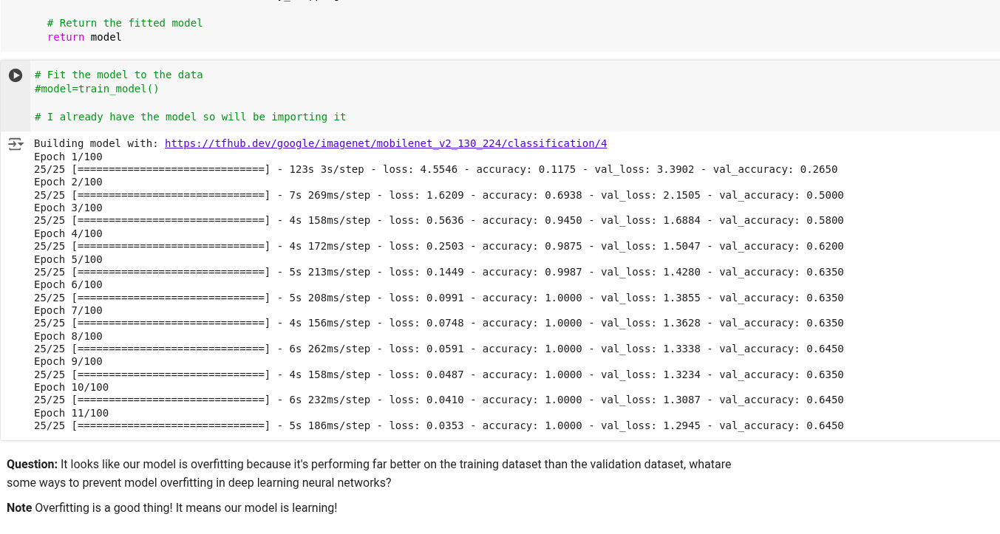

In [136]:
Image(filename="drive/MyDrive/Dog_Vision/my_images/model_training_status.png")

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, whatare some ways to  prevent model overfitting in deep learning neural networks?

**Note** Overfitting is a good thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents.

In [137]:
%tensorboard --logdir drive/MyDrive/Dog_Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [139]:
# Make predictions on the validation data (not used to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 116ms/step


array([[1.3612418e-03, 1.1666203e-04, 4.0014754e-03, ..., 3.8553047e-05,
        7.5513599e-05, 3.3999451e-03],
       [6.4797984e-03, 5.2896736e-04, 1.9622341e-02, ..., 8.2935207e-04,
        3.9291885e-03, 4.6791634e-04],
       [1.2257176e-06, 1.4559062e-04, 6.5767399e-06, ..., 1.0477746e-05,
        5.9416625e-06, 8.2895167e-05],
       ...,
       [8.0490772e-06, 9.3181472e-04, 6.1325998e-05, ..., 1.5967245e-04,
        7.4931199e-04, 2.9028195e-04],
       [4.0652137e-03, 1.1916907e-04, 5.4339405e-05, ..., 1.3111161e-04,
        3.7073434e-05, 7.2132992e-03],
       [4.0018064e-04, 5.8943417e-05, 9.3474577e-04, ..., 9.6495831e-03,
        5.3120055e-04, 5.2835127e-05]], dtype=float32)

In [140]:
predictions.shape

(200, 120)

In [141]:
len(Y_valid)

200

In [142]:
predictions[0]

array([1.36124180e-03, 1.16662028e-04, 4.00147540e-03, 9.41166654e-05,
       2.29120255e-04, 2.22762665e-05, 4.30408455e-02, 2.02627154e-04,
       1.71753039e-04, 1.61209772e-03, 9.42060200e-04, 1.34480739e-04,
       1.70356885e-04, 4.87652869e-05, 2.56718672e-03, 1.70429194e-04,
       3.78932251e-04, 5.73137030e-02, 1.54949666e-04, 7.82576608e-05,
       7.74489075e-04, 1.43161378e-04, 4.05185456e-05, 6.58849860e-03,
       4.58176437e-05, 1.68102866e-04, 1.42265648e-01, 5.15163003e-04,
       9.24243068e-04, 2.52321479e-04, 1.07914042e-04, 2.52861442e-04,
       1.21855328e-03, 1.80485178e-04, 1.10929592e-04, 1.11084588e-01,
       3.60807244e-05, 1.14940631e-03, 3.20149302e-05, 1.17500793e-04,
       1.65909436e-03, 1.63808436e-04, 2.42921364e-04, 5.10082464e-05,
       1.70319836e-05, 4.64836812e-05, 2.88413547e-04, 2.79810949e-04,
       3.00444808e-04, 2.20793474e-04, 6.03738445e-05, 1.07318010e-05,
       1.44159407e-04, 7.70943734e-05, 1.25674531e-04, 4.14264796e-05,
      

In [143]:
len(unique_breeds)

120

In [144]:
# This means that the predictions has 200 images with each image having values of probability that it has for every 120 breeds. The highest value will become the breed of that image

In [145]:
np.sum(predictions[0])

1.0000001

In [146]:
# First prediction
np.argmax(predictions[0])

59

In [147]:
unique_breeds[np.argmax(predictions[0])]

'irish_wolfhound'

In [148]:
index=42
print(f"Probabilities for dog:{predictions[index]}")
print(f"Highest probability:{np.max(predictions[index])}")
print(f"Index of highest probability:{np.argmax(predictions[index])}")
print(f"Breed:{unique_breeds[np.argmax(predictions[index])]}")

Probabilities for dog:[5.16864202e-05 1.61362797e-04 5.74677870e-05 5.97679900e-05
 3.39904660e-03 1.97630623e-04 4.45120124e-04 7.48871127e-04
 4.59791021e-03 4.38389368e-02 7.69831749e-05 2.80662007e-05
 3.15503508e-04 2.80599133e-03 5.42320369e-04 2.90636066e-03
 5.19866371e-05 2.83074012e-04 3.09133466e-04 2.27785349e-04
 1.35489481e-05 2.73321435e-04 9.23104017e-05 1.40908596e-04
 1.17984079e-02 4.23158199e-05 1.59458614e-05 2.08910817e-04
 4.62833850e-04 5.83911497e-05 2.18619301e-04 1.62945551e-04
 2.46401585e-04 4.01421385e-05 5.55066181e-05 1.71653792e-05
 2.11881576e-04 4.16022434e-04 2.97218885e-05 1.25592634e-01
 4.12075780e-04 1.10932488e-05 4.26395377e-03 2.18859932e-05
 1.91034807e-04 5.21395668e-05 4.07465093e-04 2.91077507e-04
 3.05664435e-05 1.09977969e-04 7.39751995e-05 6.13368393e-05
 1.46268212e-04 1.33217545e-03 8.45862905e-06 3.45158798e-04
 1.35233684e-04 5.22892988e-05 9.98283940e-05 9.00391024e-05
 1.74096815e-04 8.24496237e-05 1.54269110e-05 1.48832196e-05
 9

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on

**Note:** Prediction probabilities are also known as confidence levels.

In [149]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get predictied label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label

'chihuahua'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predcitions on the validation images and then compare those preditcions to the validation labels (truth labels).

In [150]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [151]:
# Create a function to unbatch a batch dataset
images_=[]
labels_=[]

# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [152]:
get_pred_label(labels_[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Lets make some function to visualize all these

We'll create a function which :
* Takes an array of prediction probabilities, an array of truth labels and an arrray of images and integers
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its prediced probability, the truth label and the target image on a single plot.

In [153]:
def plot_pred(pred_prob,true_label,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob=pred_prob[n]
  true_label=unique_breeds[np.argmax(true_label[n])]
  images=images[n]
  pred_label=get_pred_label(pred_prob)

  plt.imshow(images)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on whether the predicted and the true label are equal or not
  if pred_label==true_label:
    color="green"
  else :
    color="red"
  plt.colormaps()
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title(f"{pred_label}  {np.max(pred_prob)*(100):2.0f}%  {true_label}",color=color)

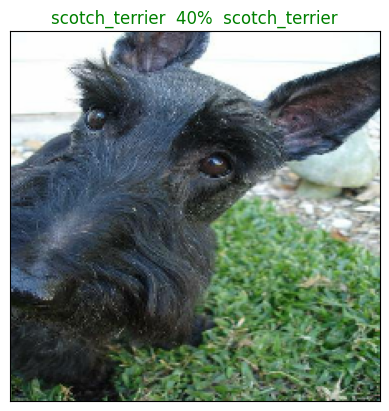

In [154]:
plot_pred(pred_prob=predictions,true_label=val_labels,images=val_images,n=1)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Fint the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [155]:
def plot_pred_conf(pred_prob, labels, n=1):
    """
    Plots the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob = pred_prob[n]
    true_label = unique_breeds[np.argmax(labels[n])]

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

    # Change color of true label if it's in the top 10
    if true_label in top_10_pred_labels:
        index = list(top_10_pred_labels).index(true_label)
        top_plot[index].set_color("green")

    plt.show()


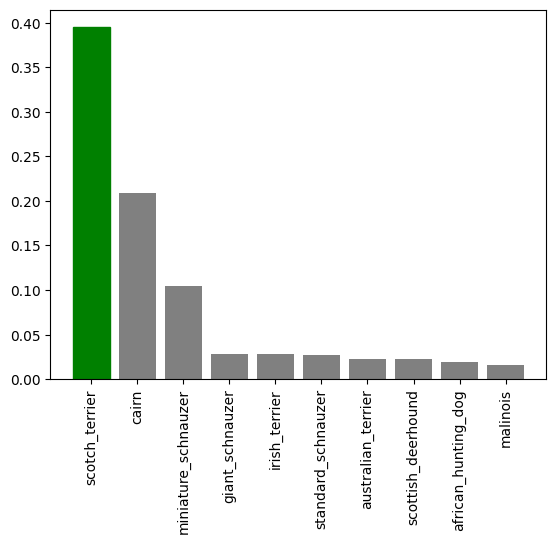

In [156]:
plot_pred_conf(pred_prob=predictions,labels=val_labels,n=1)

In [157]:
for i in np.argsort(predictions[1])[-10:][::-1]:
  print(f"{np.argsort(predictions[1])[i]}   {unique_breeds[np.argsort(predictions[1])[i]]}")

81   norwich_terrier
83   otterhound
35   dandie_dinmont
99   shetland_sheepdog
78   newfoundland
102   silky_terrier
114   weimaraner
64   kerry_blue_terrier
52   great_pyrenees
117   whippet


In [158]:
print("hellp")

hellp


Now we've got functions to help us visualize our predictions and evaluate our model, let's check out a few

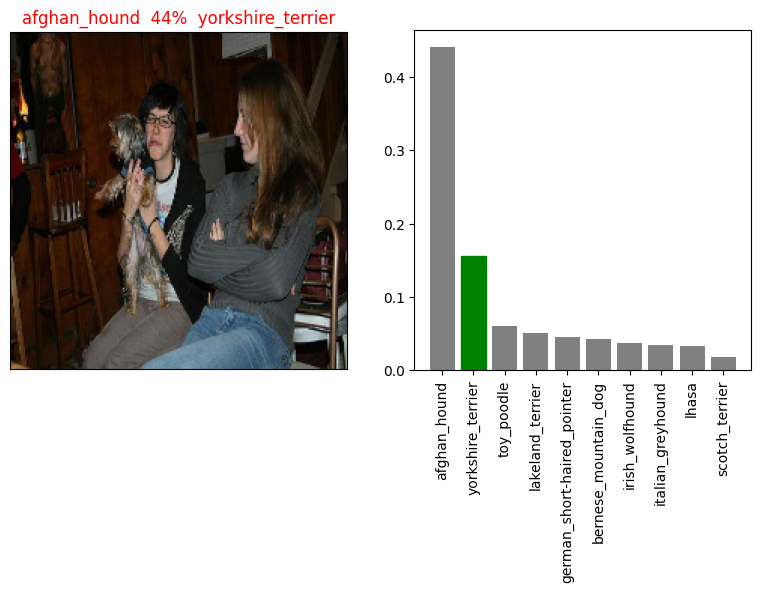

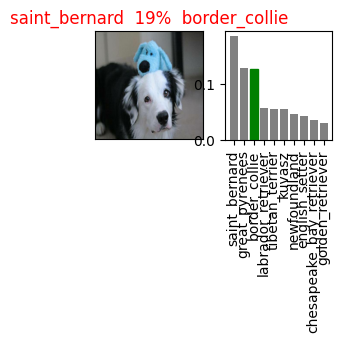

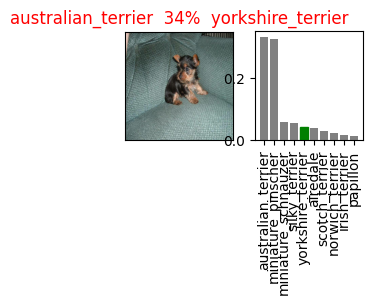

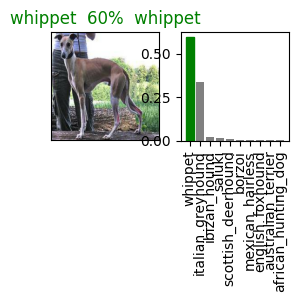

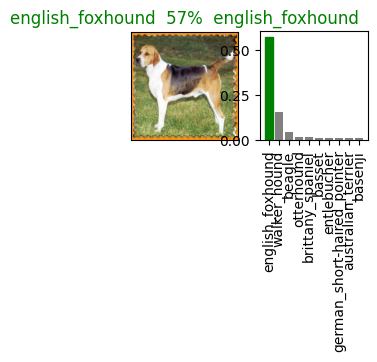

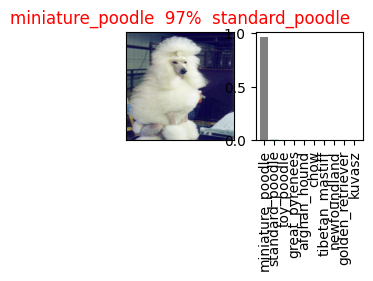

<Figure size 640x480 with 0 Axes>

In [159]:
# Let's check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(pred_prob=predictions,true_label=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(pred_prob=predictions,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(rect=[1,1,1,1])
plt.show()


**Challenge** How would you create a confusion matrix with our models predictions and true labels?

In [160]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Creates a model directorypathname with current time
  modeldir=os.path.join("drive/MyDrive/Dog_Vision/models",datetime.datetime.now().strftime("%Y%m%d=%H%M%s"))
  model_path=modeldir+"-"+suffix+"h.5" # save format of model
  print(f"Saving model to :{model_path}")
  model.save(model_path)
  return model_path

In [161]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from :{model_path}")
  model=tf_keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [162]:
# Save our mdoel trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog_Vision/models/20250114=05011736830871-1000-images-mobilenetv2-Adamh.5


'drive/MyDrive/Dog_Vision/models/20250114=05011736830871-1000-images-mobilenetv2-Adamh.5'

In [163]:
# Load a trained model
loaded_model=loaded_1000_image_model=load_model("drive/MyDrive/Dog_Vision/models/20250113=05561736747819-1000-images-mobilenetv2-Adamh.5")

Loading saved model from :drive/MyDrive/Dog_Vision/models/20250113=05561736747819-1000-images-mobilenetv2-Adamh.5


In [164]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 110ms/step - loss: 1.2945 - accuracy: 0.6450


[1.2944574356079102, 0.6449999809265137]

In [165]:
# Evaluate loaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 107ms/step - loss: 1.2945 - accuracy: 0.6450


[1.2944574356079102, 0.6449999809265137]

In [166]:
## Training a big dog model(on full data)

In [167]:
len(X),len(Y)

(10222, 10222)

In [168]:
X[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [169]:
# Create a data batch with teh full data set
full_data=create_data_batches(X,Y)

Creating training data batches:


In [170]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [171]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [172]:
# Create a full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping=tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note** Running the cell below may take a little while(maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into the memory

In [173]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 58s 157ms/step - loss: 1.3300 - accuracy: 0.6769
Epoch 2/100
320/320 [==============================] - 48s 150ms/step - loss: 0.4030 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 57s 178ms/step - loss: 0.2395 - accuracy: 0.9316
Epoch 4/100
320/320 [==============================] - 46s 145ms/step - loss: 0.1562 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 48s 149ms/step - loss: 0.1067 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0775 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0592 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0463 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0367 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 46s 145m

In [174]:
save_model(full_model,suffix="1000-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog_Vision/models/20250114=05241736832240-1000-images-mobilenetv2-Adamh.5


'drive/MyDrive/Dog_Vision/models/20250114=05241736832240-1000-images-mobilenetv2-Adamh.5'

In [175]:
#loaded_full_model=load_model('drive/MyDrive/Dog_Vision/models/20250113=13451736775936-1000-images-mobilenetv2-Adamh.5')

Loading saved model from :drive/MyDrive/Dog_Vision/models/20250113=13451736775936-1000-images-mobilenetv2-Adamh.5


In [176]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on imaegs in the form of Tensor Bacthes, to make predictions on the test data, we have to get it into the same format

Luckily we created `create_data_bacthes()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert them into batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [177]:
# Load test image filenames
test_path="drive/MyDrive/Dog_Vision/test/"
test_filename=[test_path+fname for fname in os.listdir(test_path)]
test_filename[:10]

['drive/MyDrive/Dog_Vision/test/f8de6b5fe68dfc6c2b8dd8d6126b20df.jpg',
 'drive/MyDrive/Dog_Vision/test/ffa76e07dc686174c2a55fdbdca68bb3.jpg',
 'drive/MyDrive/Dog_Vision/test/ffe2315cf566e039516f5a4a5e52ff1b.jpg',
 'drive/MyDrive/Dog_Vision/test/f7a0edb3cf98cb3377a4747c499c9c66.jpg',
 'drive/MyDrive/Dog_Vision/test/fa0b392ccbae2b59bf83afd34bd8b610.jpg',
 'drive/MyDrive/Dog_Vision/test/ff454c109c1b07a458ad30d310e9ab4c.jpg',
 'drive/MyDrive/Dog_Vision/test/fec01cfcaffca7c990619633e50b20dd.jpg',
 'drive/MyDrive/Dog_Vision/test/f805a687670be49dd8980dd06b612962.jpg',
 'drive/MyDrive/Dog_Vision/test/fe9ffddcf66c68e9bb38edcb0c6f44e1.jpg',
 'drive/MyDrive/Dog_Vision/test/fec0e1ad18d153c54a71215002ba4f04.jpg']

In [178]:
len(test_filename)

10357

In [179]:
# Create test datat batches
test_data=create_data_batches(test_filename,test_data=True)

Creating test data batches...


In [180]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** Will take around 1 hour, lot to predict

In [181]:
# Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 173s 534ms/step


In [182]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog_Vision/test_predictions.csv",test_predictions,delimiter=",")

In [183]:
test_predictions=np.loadtxt("drive/MyDrive/Dog_Vision/test_predictions.csv",delimiter=",")

In [184]:
test_predictions.shape

(10357, 120)

In [185]:
test_predictions

array([[1.15764520e-09, 1.71045198e-12, 1.00314090e-10, ...,
        2.60268786e-11, 2.65956118e-10, 2.73608958e-09],
       [1.28996203e-10, 2.31731953e-10, 1.44915839e-12, ...,
        7.56467528e-11, 7.90684900e-13, 3.93153121e-10],
       [6.59248158e-08, 3.89357185e-10, 1.22630652e-08, ...,
        1.77017778e-08, 1.19580816e-08, 6.68698021e-08],
       ...,
       [3.89802413e-09, 2.86896502e-05, 4.35506520e-10, ...,
        1.10179009e-07, 1.55654326e-11, 1.87057328e-10],
       [2.33405117e-08, 1.66768388e-07, 2.69136962e-08, ...,
        2.15170992e-08, 5.86714123e-07, 2.60550308e-07],
       [5.12061149e-08, 4.01434832e-12, 6.30636876e-08, ...,
        7.18609317e-06, 6.36930082e-08, 3.58852614e-09]])

### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID
and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas dataframe with an ID column as well as a column for each dog breed
* Add data to the id column by extracting the test image id's from their filepaths
* Add data (the prediction probabilities) to each of the dog breeds columns.
* Export the Dataframe as a CSV to submit it to Kaggle

In [186]:
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

In [187]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [188]:
os.listdir("drive/MyDrive/Dog_Vision/test/")

['f8de6b5fe68dfc6c2b8dd8d6126b20df.jpg',
 'ffa76e07dc686174c2a55fdbdca68bb3.jpg',
 'ffe2315cf566e039516f5a4a5e52ff1b.jpg',
 'f7a0edb3cf98cb3377a4747c499c9c66.jpg',
 'fa0b392ccbae2b59bf83afd34bd8b610.jpg',
 'ff454c109c1b07a458ad30d310e9ab4c.jpg',
 'fec01cfcaffca7c990619633e50b20dd.jpg',
 'f805a687670be49dd8980dd06b612962.jpg',
 'fe9ffddcf66c68e9bb38edcb0c6f44e1.jpg',
 'fec0e1ad18d153c54a71215002ba4f04.jpg',
 'f90032fc6036df7fab8f6fda5be69824.jpg',
 'f89654f9652fed8140209b60093e6f3c.jpg',
 'fa541fc080cdeffb4dd98da99f673a59.jpg',
 'f631f24341f5ed5ab5dc30b1ce3d73df.jpg',
 'f8f7740700e41c77da2ecc5953a23e9d.jpg',
 'feacb43d576eb6d78b38d4eb835d7b20.jpg',
 'fb03302b030afd122e0f4936c158f6c1.jpg',
 'f674b20155dca91ac87e2bcef27b757c.jpg',
 'f7b0596d6f3a5fe9006f04de9cf4ab0f.jpg',
 'fbffe32a243c4d30623432e558aa2c40.jpg',
 'ffbb6663b38e903dbd1efa5dce2d0bbb.jpg',
 'fefafa1c1b5877561330d0a0fd4d5440.jpg',
 'f90ac8934d1349d115a4961c20ee447b.jpg',
 'fd32579d66aa6223b19085aa600fbc2d.jpg',
 'fac2dfeeb3d968

In [189]:
test_ids = [os.path.splitext(os.path.basename(path))[0] for path in test_filename]
preds_df["id"] = test_ids


In [190]:
test_ids

['f8de6b5fe68dfc6c2b8dd8d6126b20df',
 'ffa76e07dc686174c2a55fdbdca68bb3',
 'ffe2315cf566e039516f5a4a5e52ff1b',
 'f7a0edb3cf98cb3377a4747c499c9c66',
 'fa0b392ccbae2b59bf83afd34bd8b610',
 'ff454c109c1b07a458ad30d310e9ab4c',
 'fec01cfcaffca7c990619633e50b20dd',
 'f805a687670be49dd8980dd06b612962',
 'fe9ffddcf66c68e9bb38edcb0c6f44e1',
 'fec0e1ad18d153c54a71215002ba4f04',
 'f90032fc6036df7fab8f6fda5be69824',
 'f89654f9652fed8140209b60093e6f3c',
 'fa541fc080cdeffb4dd98da99f673a59',
 'f631f24341f5ed5ab5dc30b1ce3d73df',
 'f8f7740700e41c77da2ecc5953a23e9d',
 'feacb43d576eb6d78b38d4eb835d7b20',
 'fb03302b030afd122e0f4936c158f6c1',
 'f674b20155dca91ac87e2bcef27b757c',
 'f7b0596d6f3a5fe9006f04de9cf4ab0f',
 'fbffe32a243c4d30623432e558aa2c40',
 'ffbb6663b38e903dbd1efa5dce2d0bbb',
 'fefafa1c1b5877561330d0a0fd4d5440',
 'f90ac8934d1349d115a4961c20ee447b',
 'fd32579d66aa6223b19085aa600fbc2d',
 'fac2dfeeb3d9687769744b1fcb81da07',
 'fb1b592289ef0685bf0c48fde88bb1bd',
 'f789cfce1b5af285046f91ef48234d0a',
 

In [191]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f8de6b5fe68dfc6c2b8dd8d6126b20df,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ffa76e07dc686174c2a55fdbdca68bb3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ffe2315cf566e039516f5a4a5e52ff1b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7a0edb3cf98cb3377a4747c499c9c66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,fa0b392ccbae2b59bf83afd34bd8b610,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,e008da6b957c62e7bcf6eb2ba4c2abd9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,ef3cceaaed2906916a76290fe0bd2b32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,e443bb594a89ab5fa1266748d6b41648,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,e8db9ef8056880a187f3768565f215d9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [192]:
test_predictions

array([[1.15764520e-09, 1.71045198e-12, 1.00314090e-10, ...,
        2.60268786e-11, 2.65956118e-10, 2.73608958e-09],
       [1.28996203e-10, 2.31731953e-10, 1.44915839e-12, ...,
        7.56467528e-11, 7.90684900e-13, 3.93153121e-10],
       [6.59248158e-08, 3.89357185e-10, 1.22630652e-08, ...,
        1.77017778e-08, 1.19580816e-08, 6.68698021e-08],
       ...,
       [3.89802413e-09, 2.86896502e-05, 4.35506520e-10, ...,
        1.10179009e-07, 1.55654326e-11, 1.87057328e-10],
       [2.33405117e-08, 1.66768388e-07, 2.69136962e-08, ...,
        2.15170992e-08, 5.86714123e-07, 2.60550308e-07],
       [5.12061149e-08, 4.01434832e-12, 6.30636876e-08, ...,
        7.18609317e-06, 6.36930082e-08, 3.58852614e-09]])

In [193]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions

In [194]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f8de6b5fe68dfc6c2b8dd8d6126b20df,1.157645e-09,1.710452e-12,1.003141e-10,2.956978e-10,1.886027e-06,7.577133e-07,3.380608e-11,2.900399e-10,7.604971e-12,...,2.421976e-12,1.184419e-11,4.552767e-08,4.934371e-08,1.441856e-07,1.063338e-10,2.446568e-10,2.602688e-11,2.659561e-10,2.736090e-09
1,ffa76e07dc686174c2a55fdbdca68bb3,1.289962e-10,2.317320e-10,1.449158e-12,1.656417e-10,6.018691e-09,3.226801e-09,7.980625e-12,1.078977e-09,1.302144e-10,...,1.933821e-12,2.267212e-10,2.554844e-10,1.800458e-08,1.320060e-12,6.068058e-06,1.919659e-08,7.564675e-11,7.906849e-13,3.931531e-10
2,ffe2315cf566e039516f5a4a5e52ff1b,6.592482e-08,3.893572e-10,1.226307e-08,1.435732e-07,1.753870e-09,2.240539e-10,4.323756e-10,8.913083e-11,2.721600e-11,...,7.582115e-11,6.111386e-10,5.024908e-12,1.229978e-11,6.305956e-11,6.382599e-08,9.611255e-11,1.770178e-08,1.195808e-08,6.686980e-08
3,f7a0edb3cf98cb3377a4747c499c9c66,6.452347e-08,1.284037e-08,1.635083e-06,2.853057e-07,1.184589e-05,6.396541e-09,4.717793e-12,6.063004e-06,4.709220e-04,...,1.772068e-10,2.892632e-09,7.592951e-09,1.210197e-09,5.146190e-07,2.834386e-08,3.753239e-09,4.774821e-06,1.121055e-09,7.460677e-09
4,fa0b392ccbae2b59bf83afd34bd8b610,1.471252e-09,7.956036e-12,7.631096e-10,2.793982e-12,1.720142e-11,2.440259e-10,2.360400e-09,9.129803e-12,6.156047e-15,...,1.749360e-12,1.095031e-12,1.617826e-12,1.555501e-11,1.080383e-10,9.415744e-14,4.327646e-11,9.770396e-14,5.522960e-12,1.411879e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,e008da6b957c62e7bcf6eb2ba4c2abd9,9.456203e-08,4.899188e-10,5.420247e-07,8.750887e-10,1.543382e-06,4.216147e-09,6.518755e-10,1.642613e-07,2.057901e-08,...,2.087990e-07,3.388553e-06,1.256552e-09,2.265586e-07,1.756800e-10,1.317303e-07,9.901888e-01,3.018275e-07,1.126601e-04,3.152748e-06
10353,ef3cceaaed2906916a76290fe0bd2b32,7.387934e-10,1.037279e-10,1.954059e-11,9.446672e-16,3.798686e-09,4.321472e-12,1.856176e-12,4.541760e-09,3.655544e-09,...,1.370387e-09,2.377798e-06,7.079371e-13,5.400805e-12,1.901822e-12,1.446871e-09,7.644358e-08,9.892794e-09,6.991096e-06,2.515208e-08
10354,e443bb594a89ab5fa1266748d6b41648,3.898024e-09,2.868965e-05,4.355065e-10,3.081130e-05,9.501049e-12,1.777284e-07,3.395718e-12,6.695158e-12,4.273420e-11,...,5.988978e-09,5.283530e-13,3.427277e-08,2.356050e-06,3.182246e-07,6.791314e-11,2.271705e-11,1.101790e-07,1.556543e-11,1.870573e-10
10355,e8db9ef8056880a187f3768565f215d9,2.334051e-08,1.667684e-07,2.691370e-08,2.223455e-07,3.084614e-10,2.832040e-06,7.709432e-09,5.440102e-10,1.584078e-07,...,1.409167e-09,2.659045e-08,6.098895e-07,7.607950e-06,2.864658e-08,8.479488e-01,1.056616e-08,2.151710e-08,5.867141e-07,2.605503e-07


In [195]:
preds_df.to_csv("drive/MyDrive/Dog_Vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to custome images.


In [196]:
fp="drive/MyDrive/Dog_Vision/my_own_test_images/"

custom_images_path=[fp+fname for fname in os.listdir(fp)]

In [197]:
custom_images_path

['drive/MyDrive/Dog_Vision/my_own_test_images/dalmatian.jpeg',
 'drive/MyDrive/Dog_Vision/my_own_test_images/bulldog.jpeg']

In [198]:
custom_data=create_data_batches(custom_images_path,test_data=True)

Creating test data batches...


In [199]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [200]:
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 579ms/step


In [201]:
custom_preds

array([[2.04637137e-04, 2.89339391e-06, 8.42957001e-04, 1.69934162e-06,
        1.07338075e-02, 1.07984652e-03, 2.85748629e-05, 1.03061975e-05,
        9.58186092e-07, 1.20484236e-08, 1.76263275e-04, 6.45847607e-08,
        5.90439013e-04, 2.85870442e-07, 8.46364344e-07, 1.20234368e-02,
        1.60416239e-04, 1.88247839e-04, 2.34461504e-06, 3.48749427e-06,
        1.14385772e-03, 4.24893096e-06, 5.81738959e-06, 8.50296601e-06,
        3.97177701e-07, 5.41324289e-06, 6.84593670e-06, 1.42875820e-06,
        1.58403452e-06, 2.92257009e-05, 1.42266015e-06, 3.07817550e-06,
        1.04640339e-05, 3.68156293e-07, 5.82101680e-02, 1.44407113e-05,
        3.72701925e-06, 1.04526741e-07, 1.54788941e-04, 1.34865975e-03,
        2.51130015e-03, 2.24462365e-05, 4.93412837e-04, 2.34828735e-06,
        1.49968965e-02, 3.68690553e-06, 5.03724266e-07, 1.42510704e-04,
        2.15630134e-04, 6.31095372e-06, 4.36411847e-06, 8.36776078e-01,
        4.56653761e-05, 7.74119599e-06, 2.06033928e-06, 1.678621

In [202]:
custom_preds.shape

(2, 120)

In [204]:
# Get custom imagee prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['great_dane', 'bull_mastiff']

In [205]:
# Get custom images (our unbatchify() function won't work since there aren't labels.. maybe we could fix it later)
custom_images=[]

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

custom_images

[array([[[0.42352945, 0.5372549 , 0.2784314 ],
         [0.42352945, 0.5372549 , 0.2784314 ],
         [0.42352945, 0.5372549 , 0.2784314 ],
         ...,
         [0.37254903, 0.48627454, 0.30588236],
         [0.37254903, 0.48627454, 0.30588236],
         [0.37254903, 0.48627454, 0.30588236]],
 
        [[0.40119052, 0.514916  , 0.25609246],
         [0.40119052, 0.514916  , 0.25609246],
         [0.40119052, 0.514916  , 0.25609246],
         ...,
         [0.36417192, 0.47789744, 0.29750526],
         [0.36417192, 0.47789744, 0.29750526],
         [0.36417192, 0.47789744, 0.29750526]],
 
        [[0.37584037, 0.48956585, 0.2307423 ],
         [0.37584037, 0.48956585, 0.2307423 ],
         [0.37584037, 0.48956585, 0.2307423 ],
         ...,
         [0.3567052 , 0.4704307 , 0.29003853],
         [0.3567052 , 0.4704307 , 0.29003853],
         [0.3567052 , 0.4704307 , 0.29003853]],
 
        ...,
 
        [[0.300781  , 0.43232524, 0.24138315],
         [0.27831632, 0.40876102, 0.21224

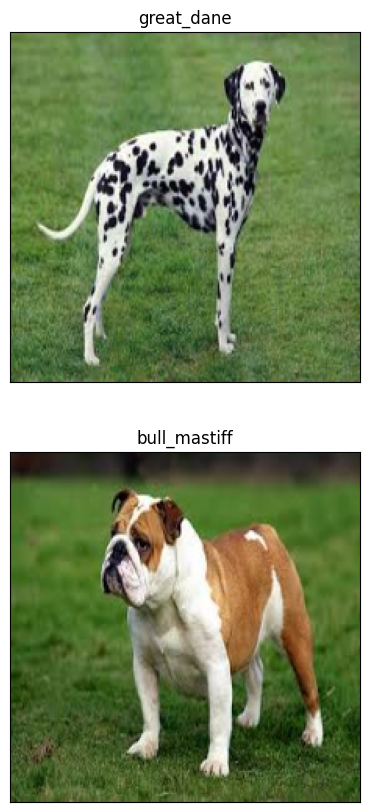

In [209]:
# Check custom image predictions
fig,ax=plt.subplots(len(custom_images),1,figsize=(10,10))

for i, image in enumerate(custom_images):
  ax[i].imshow(image)
  ax[i].set_title(custom_pred_labels[i])
  ax[i].set_xticks([])
  ax[i].set_yticks([])